# 프로젝트 1: Image Classification


## 1. VGG16 모델
## 2. 2. 코드 살펴보기

In [1]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

import os
import numpy as np
import matplotlib.pyplot as plt

In [2]:
_URL = 'https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip'

path_to_zip = tf.keras.utils.get_file('cats_and_dogs.zip', origin=_URL, extract=True)

path = os.path.join(os.path.dirname(path_to_zip), 'cats_and_dogs_filtered')

68606236/68606236 [==============================] - 2s 0us/step


In [3]:
train_dir = os.path.join(path, 'train')
validation_dir = os.path.join(path, 'validation')
print(train_dir)
print(validation_dir)

/Users/inho/.keras/datasets/cats_and_dogs_filtered/train
/Users/inho/.keras/datasets/cats_and_dogs_filtered/validation


In [4]:
# directory with our training cat pictures
train_cats_dir = os.path.join(train_dir, 'cats') 
print(train_cats_dir)

# directory with our training dog pictures 
train_dogs_dir = os.path.join(train_dir, 'dogs')  
print(train_dogs_dir)

# directory with our validation cat pictures
validation_cats_dir = os.path.join(validation_dir, 'cats')  
print(validation_cats_dir)

# directory with our validation dog pictures
validation_dogs_dir = os.path.join(validation_dir, 'dogs')  
print(validation_dogs_dir)

/Users/inho/.keras/datasets/cats_and_dogs_filtered/train/cats
/Users/inho/.keras/datasets/cats_and_dogs_filtered/train/dogs
/Users/inho/.keras/datasets/cats_and_dogs_filtered/validation/cats
/Users/inho/.keras/datasets/cats_and_dogs_filtered/validation/dogs


In [5]:
num_cats_tr = len(os.listdir(train_cats_dir))
print('total training cat images:', num_cats_tr)
num_dogs_tr = len(os.listdir(train_dogs_dir))
print('total training dog images:', num_dogs_tr)

print("--")

num_cats_val = len(os.listdir(validation_cats_dir))
print('total validation cat images:', num_cats_val)
num_dogs_val = len(os.listdir(validation_dogs_dir))
print('total validation dog images:', num_dogs_val)

print("--")

total_train = num_cats_tr + num_dogs_tr
print("Total training images:", total_train)
total_val = num_cats_val + num_dogs_val
print("Total validation images:", total_val)

total training cat images: 1000
total training dog images: 1000
--
total validation cat images: 500
total validation dog images: 500
--
Total training images: 2000
Total validation images: 1000


In [6]:
# parameter Initialization
batch_size = 16
epochs = 5
IMG_HEIGHT = 256
IMG_WIDTH = 256

In [7]:
# 데이터를 시각화하기 위한 함수
def plotImages(images_arr):
    fig, axes = plt.subplots(1, 5, figsize=(10,10))
    axes = axes.flatten()
    for img, ax in zip(images_arr, axes):
        ax.imshow(img)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

In [8]:
# Training data generator
image_gen_train = ImageDataGenerator(rescale=1./255,
                                     rotation_range=0.3,
                                     width_shift_range=0.1,
                                     height_shift_range=0.1,
                                     zoom_range=0.2,
                                     horizontal_flip=True, 
                                     vertical_flip=False)

In [9]:
train_data_gen = image_gen_train.flow_from_directory(batch_size=batch_size,
                                                     directory=train_dir,
                                                     shuffle=True,
                                                     target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                     class_mode='binary')

Found 2000 images belonging to 2 classes.


In [10]:
train_data_gen[0][0].shape

(16, 256, 256, 3)

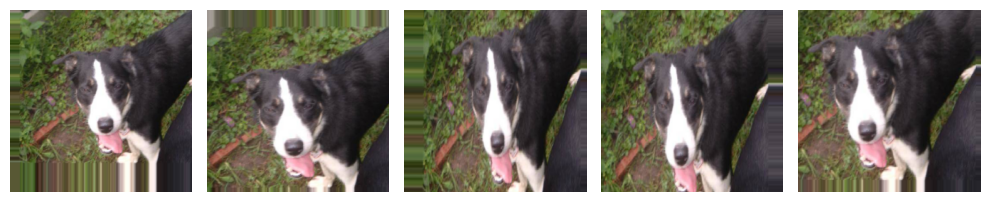

In [11]:
augmented_images = [train_data_gen[0][0][0] for i in range(5)]
plotImages(augmented_images)

In [12]:
# Validation data generator
image_gen_val = ImageDataGenerator(rescale=1./255)

In [13]:
val_data_gen = image_gen_val.flow_from_directory(batch_size=batch_size,
                                                 directory=validation_dir,
                                                 target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                 class_mode='binary')

Found 1000 images belonging to 2 classes.


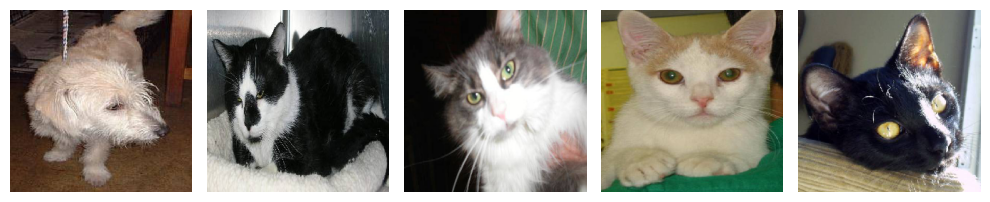

In [14]:
sample_training_images, _ = next(val_data_gen)
plotImages(sample_training_images[:5])

In [15]:
_[:5] # 정답 데이터

array([1., 0., 0., 0., 0.], dtype=float32)

## 문제 1-1. VGG16 모델 구현하기

In [16]:
# 문제1-1. 이미지에 나온 VGG16 모델을 구현하세요.  
input_layer=tf.keras.layers.Input(shape=(256, 256, 3))
x=tf.keras.layers.Conv2D(32, (3, 3), strides=1, activation='relu', padding='same')(input_layer)
x=tf.keras.layers.Conv2D(32, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.BatchNormalization()(x)
x=tf.keras.layers.MaxPool2D((2, 2))(x)

x=tf.keras.layers.Conv2D(64, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.Conv2D(64, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.BatchNormalization()(x)
x=tf.keras.layers.MaxPool2D((2, 2))(x)

x=tf.keras.layers.Conv2D(128, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.Conv2D(128, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.BatchNormalization()(x)
x=tf.keras.layers.MaxPool2D((2, 2))(x)

x=tf.keras.layers.Flatten()(x)
x=tf.keras.layers.Dense(1024, activation='relu')(x)
x=tf.keras.layers.Dense(512, activation='relu')(x)
out_layer=tf.keras.layers.Dense(1, activation='sigmoid')(x)

model = tf.keras.Model(inputs=[input_layer], outputs=[out_layer])
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 256, 256, 32)      896       
                                                                 
 conv2d_1 (Conv2D)           (None, 256, 256, 32)      9248      
                                                                 
 batch_normalization (BatchN  (None, 256, 256, 32)     128       
 ormalization)                                                   
                                                                 
 max_pooling2d (MaxPooling2D  (None, 128, 128, 32)     0         
 )                                                               
                                                                 
 conv2d_2 (Conv2D)           (None, 128, 128, 64)      18496 

In [17]:
loss_function=tf.keras.losses.binary_crossentropy
optimize=tf.keras.optimizers.Adam(learning_rate=0.01)
metric=tf.keras.metrics.binary_accuracy
model.compile(loss=loss_function,
              optimizer=optimize,
              metrics=[metric])

#callbacks_list= [tf.keras.callbacks.TensorBoard(log_dir='log_dir', histogram_freq=1)]
# callback 함수를 활용하고 싶다면 추가해서 학습하는 데에 활용해 보세요.

In [18]:
history = model.fit(
      train_data_gen,
      steps_per_epoch=(len(os.listdir(train_cats_dir)) + len(os.listdir(train_dogs_dir)))/batch_size,
      epochs=epochs,
      validation_data=val_data_gen,
      #callbacks=callbacks_list,
      validation_freq=1)

Epoch 1/5


2023-11-08 16:20:26.915952: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]
2023-11-08 16:20:26.934117: W tensorflow/tsl/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz


125/125 [==============================] - ETA: 0s - loss: 48.6866 - binary_accuracy: 0.4875

2023-11-08 16:22:08.828013: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


125/125 [==============================] - 117s 930ms/step - loss: 48.6866 - binary_accuracy: 0.4875 - val_loss: 0.8452 - val_binary_accuracy: 0.5000
Epoch 2/5
125/125 [==============================] - 117s 934ms/step - loss: 0.7145 - binary_accuracy: 0.4960 - val_loss: 0.6970 - val_binary_accuracy: 0.4960
Epoch 3/5
125/125 [==============================] - 115s 918ms/step - loss: 0.6944 - binary_accuracy: 0.5075 - val_loss: 0.6964 - val_binary_accuracy: 0.5000
Epoch 4/5
125/125 [==============================] - 117s 935ms/step - loss: 0.6949 - binary_accuracy: 0.4900 - val_loss: 0.6988 - val_binary_accuracy: 0.5040
Epoch 5/5
125/125 [==============================] - 117s 936ms/step - loss: 0.6980 - binary_accuracy: 0.4990 - val_loss: 0.6966 - val_binary_accuracy: 0.5010


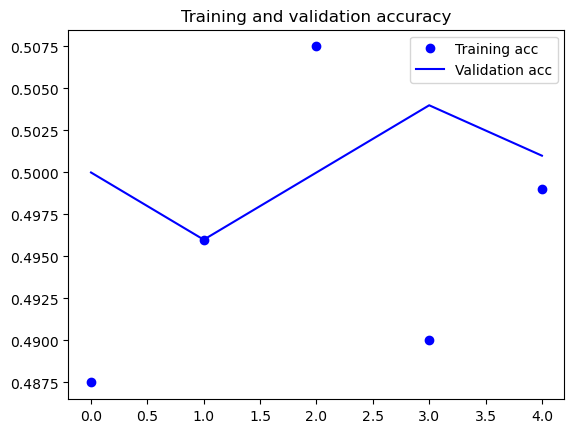

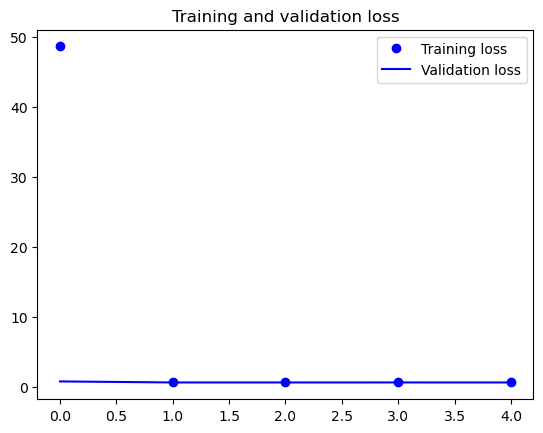

In [19]:
acc = history.history['binary_accuracy']
val_acc = history.history['val_binary_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(len(acc))

plt.plot(epochs_range, acc, 'bo', label='Training acc')
plt.plot(epochs_range, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs_range, loss, 'bo', label='Training loss')
plt.plot(epochs_range, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

## 문제 1-2. 다양한 방법을 사용하여 모델의 성능 올리기

In [20]:
# 문제 1-2. hyperparameter 설정
batch_size = 32 # 16 -> 32
epochs = 5
IMG_HEIGHT = 256
IMG_WIDTH = 256

In [21]:
# 문제 1-2. 데이터 generator 생성
# Train data generator 튜닝
image_gen_train = ImageDataGenerator(
                    rescale=1./255,
                    rotation_range=0.5,# 0.3 -> 0.5
                    width_shift_range=.15,# 0.1 -> 0.15
                    height_shift_range=.15,# 0.1 -> 0.15
                    horizontal_flip=True,
                    vertical_flip=True,# False -> True
                    zoom_range=0.5)# 0.2 -> 0.5
train_data_gen = image_gen_train.flow_from_directory(
                                        batch_size=batch_size,
                                        directory=train_dir,
                                        shuffle=True,
                                        target_size=(IMG_HEIGHT, IMG_WIDTH),
                                        class_mode='binary')

# Validation data generator
image_gen_val = ImageDataGenerator(rescale=1./255)

val_data_gen = image_gen_val.flow_from_directory(batch_size=batch_size,
                                                 directory=validation_dir,
                                                 target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                 class_mode='binary')

Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


In [22]:
# 문제 1-2. 모델 구현
# Skip connection 추가 및 Batch Normalization, Dropout 추가
input_layer = tf.keras.layers.Input(shape=(256, 256, 3))

conv1 = tf.keras.layers.Conv2D(64, (3, 3), strides=1, activation='relu', padding='same')(input_layer)
conv2 = tf.keras.layers.Conv2D(64, (3, 3), strides=1, activation='relu', padding='same')(conv1)
x = tf.keras.layers.BatchNormalization()(conv2)
x_shortcut = tf.keras.layers.Conv2D(64, (1, 1), strides=1, padding='same')(input_layer)
x_shortcut = tf.keras.layers.BatchNormalization()(x_shortcut)
x = tf.keras.layers.Add()([x, x_shortcut])
x = tf.keras.layers.MaxPool2D((2, 2))(x)

conv3 = tf.keras.layers.Conv2D(128, (3, 3), strides=1, activation='relu', padding='same')(x)
conv4 = tf.keras.layers.Conv2D(128, (3 ,3), strides=1 ,activation ='relu', padding ='same')(conv3)
x = tf.keras.layers.BatchNormalization()(conv4)
x_shortcut = tf.keras.layers.Conv2D(128, (1, 1), strides=1, padding='same')(x)
x_shortcut = tf.keras.layers.BatchNormalization()(x_shortcut)
x = tf.keras.layers.Add()([x, x_shortcut])
x = tf.keras.layers.MaxPool2D((4, 4))(x)

conv5 = tf.keras.layers.Conv2D(256, (3, 3), strides=1, activation='relu', padding='same')(x)
conv6 = tf.keras.layers.Conv2D(256, (3, 3), strides=1, activation='relu', padding='same')(conv5)
x = tf.keras.layers.BatchNormalization()(conv6)
x_shortcut = tf.keras.layers.Conv2D(256, (1, 1), strides=1, padding='same')(x)
x_shortcut = tf.keras.layers.BatchNormalization()(x_shortcut)
x = tf.keras.layers.Add()([x, x_shortcut])
x = tf.keras.layers.MaxPool2D((8, 8))(x)

conv7 = tf.keras.layers.Conv2D(512, (3, 3), strides=1, activation='relu', padding='same')(x)
conv8 = tf.keras.layers.Conv2D(512, (3, 3), strides=1, activation='relu', padding='same')(conv7)
x = tf.keras.layers.BatchNormalization()(conv8)
x_shortcut = tf.keras.layers.Conv2D(512, (1, 1), strides=1, padding='same')(x)
x_shortcut = tf.keras.layers.BatchNormalization()(x_shortcut)
x = tf.keras.layers.Add()([x, x_shortcut])
x = tf.keras.layers.MaxPool2D((2, 2))(x)

x = tf.keras.layers.Flatten()(x)
x = tf.keras.layers.Dropout(0.5)(x)
x = tf.keras.layers.Dense(256, activation='relu')(x)
x = tf.keras.layers.Dense(128, activation='relu')(x)
out_layer = tf.keras.layers.Dense(1, activation='sigmoid')(x)

model = tf.keras.Model(inputs=[input_layer], outputs=[out_layer])

In [23]:
# 문제 1-2. loss function, optimizer, metric 설정 및 모델 컴파일
#Learning rate 조정 0.01 -> 0.001
loss_function=tf.keras.losses.binary_crossentropy
optimize=tf.keras.optimizers.Adam(learning_rate=0.001)
metric=tf.keras.metrics.binary_accuracy
model.compile(loss=loss_function,
              optimizer=optimize,
              metrics=[metric])

In [24]:
# 모델 학습
history = model.fit(
      train_data_gen,
      steps_per_epoch=(len(os.listdir(train_cats_dir)) + len(os.listdir(train_dogs_dir)))/batch_size,
      epochs=epochs,
      validation_data=val_data_gen,
      # callbacks=callbacks_list,
      validation_freq=1)

Epoch 1/5


2023-11-08 16:30:38.866277: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


63/62 [==============================] - ETA: -1s - loss: 0.8419 - binary_accuracy: 0.5540

2023-11-08 16:34:44.493972: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


62/62 [==============================] - 279s 4s/step - loss: 0.8419 - binary_accuracy: 0.5540 - val_loss: 0.7398 - val_binary_accuracy: 0.4990
Epoch 2/5
62/62 [==============================] - 277s 4s/step - loss: 0.6669 - binary_accuracy: 0.6005 - val_loss: 0.9066 - val_binary_accuracy: 0.5000
Epoch 3/5
62/62 [==============================] - 276s 4s/step - loss: 0.6463 - binary_accuracy: 0.6215 - val_loss: 1.5700 - val_binary_accuracy: 0.5000
Epoch 4/5
62/62 [==============================] - 275s 4s/step - loss: 0.6195 - binary_accuracy: 0.6520 - val_loss: 1.0811 - val_binary_accuracy: 0.5000
Epoch 5/5
62/62 [==============================] - 273s 4s/step - loss: 0.6318 - binary_accuracy: 0.6500 - val_loss: 0.7466 - val_binary_accuracy: 0.5480


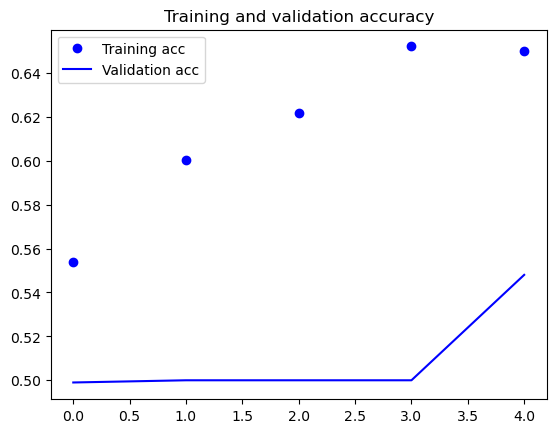

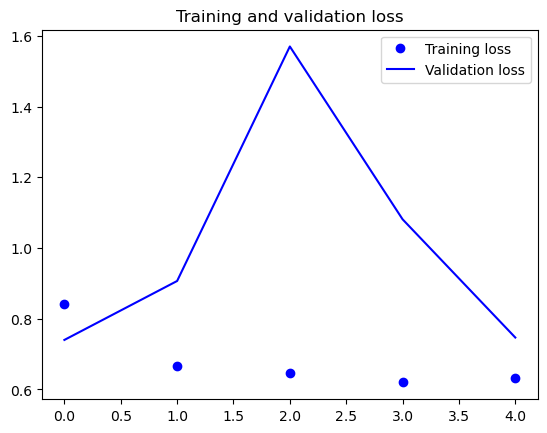

In [25]:
acc = history.history['binary_accuracy']
val_acc = history.history['val_binary_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(len(acc))

plt.plot(epochs_range, acc, 'bo', label='Training acc')
plt.plot(epochs_range, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs_range, loss, 'bo', label='Training loss')
plt.plot(epochs_range, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

## 10-3. 프로젝트 2: Object Detection


### 1. Faster RCNN

In [26]:
!pip3 install tensorflow-estimator==2.6.0

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 462.9/462.9 kB 17.1 MB/s eta 0:00:00
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.12.0
    Uninstalling tensorflow-estimator-2.12.0:
      Successfully uninstalled tensorflow-estimator-2.12.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.12.0 requires jax>=0.3.15, which is not installed.
tensorflow 2.12.0 requires libclang>=13.0.0, which is not installed.
tensorflow 2.12.0 requires tensorflow-estimator<2.13,>=2.12.0, but you have tensorflow-estimator 2.6.0 which is incompatible.


In [31]:
# Tensorflow와 Tensoflow Hub에 있는 이미 학습된 모델을 활용하기 위한 모듈 
import tensorflow as tf
import tensorflow_hub as hub

# 이미지를 다운로드하는 데에 사용하는 모듈
import matplotlib.pyplot as plt
import tempfile 
from six.moves.urllib.request import urlopen
from six import BytesIO

# 이미지에 선과 폰트를 넣기 위한 모듈
import numpy as np
from PIL import Image
from PIL import ImageColor
from PIL import ImageDraw
from PIL import ImageFont
from PIL import ImageOps

# Detection하는 데에 소요된 시간을 점검하기 위한 모듈
import time

In [32]:
def display_image(image):
  fig = plt.figure(figsize=(20, 15))
  plt.grid(False)
  plt.imshow(image)

In [33]:
def download_and_resize_image(url, new_width=256, new_height=256, display=False): 
  
  _, filename = tempfile.mkstemp(suffix=".jpg")
  response = urlopen(url)
  image_data = response.read()
  image_data = BytesIO(image_data)  # 이미지 읽기
  pil_image = Image.open(image_data)
  pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.ANTIALIAS) # 이미지 조정
  pil_image_rgb = pil_image.convert("RGB") #RBG로 변환
  pil_image_rgb.save(filename, format="JPEG", quality=90) # 이미지 저장
  print("Image downloaded to %s." % filename)
  if display:
    display_image(pil_image)
  return filename

In [35]:
def draw_bounding_box_on_image(image, 
                               ymin, xmin, ymax, xmax,
                               color,
                               font,
                               thickness=4,
                               display_str_list=()):
  
  draw = ImageDraw.Draw(image)
  im_width, im_height = image.size
  (left, right, top, bottom) = (xmin * im_width, xmax * im_width,
                                ymin * im_height, ymax * im_height)

# BBox 테두리 그리기
  draw.line([(left, top), (left, bottom), (right, bottom), (right, top),
             (left, top)],
            width=thickness,
            fill=color)

  display_str_heights = [font.getsize(ds)[1] for ds in display_str_list]
  
  total_display_str_height = (1 + 2 * 0.05) * sum(display_str_heights)

  if top > total_display_str_height:
    text_bottom = top
  else:
    text_bottom = top + total_display_str_height
  
  for display_str in display_str_list[::-1]:
    text_width, text_height = font.getsize(display_str)
    margin = np.ceil(0.05 * text_height)
    draw.rectangle([(left, text_bottom - text_height - 2 * margin),
                    (left + text_width, text_bottom)],
                   fill=color)
    draw.text((left + margin, text_bottom - text_height - margin),
              display_str,
              fill="black",
              font=font)
    text_bottom -= text_height - 2 * margin

In [36]:
# BBox 그리기
def draw_boxes(image, boxes, class_names, scores, max_boxes=10, min_score=0.1): 
  colors = list(ImageColor.colormap.values())

  try:
    font = ImageFont.truetype("/usr/share/fonts/truetype/liberation/LiberationSansNarrow-Regular.ttf",
                              25)
  except IOError:
    print("Font not found, using default font.")
    font = ImageFont.load_default()

# BBox 그리기 적용
  for i in range(min(boxes.shape[0], max_boxes)):
    if scores[i] >= min_score:
      ymin, xmin, ymax, xmax = tuple(boxes[i])  # 박스 좌표값
      display_str = "{}: {}%".format(class_names[i].decode("ascii"),
                                     int(100 * scores[i]))
      color = colors[hash(class_names[i]) % len(colors)]
      image_pil = Image.fromarray(np.uint8(image)).convert("RGB")
      draw_bounding_box_on_image(
          image_pil,
          ymin,
          xmin,
          ymax,
          xmax,
          color,
          font,
          display_str_list=[display_str])
      np.copyto(image, np.array(image_pil))
  return image

/var/folders/pr/61td1y8x20gbmv2fk3q0zlyc0000gn/T/ipykernel_84515/3586607056.py:8: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.ANTIALIAS) # 이미지 조정


Image downloaded to /var/folders/pr/61td1y8x20gbmv2fk3q0zlyc0000gn/T/tmpfy62sl0v.jpg.


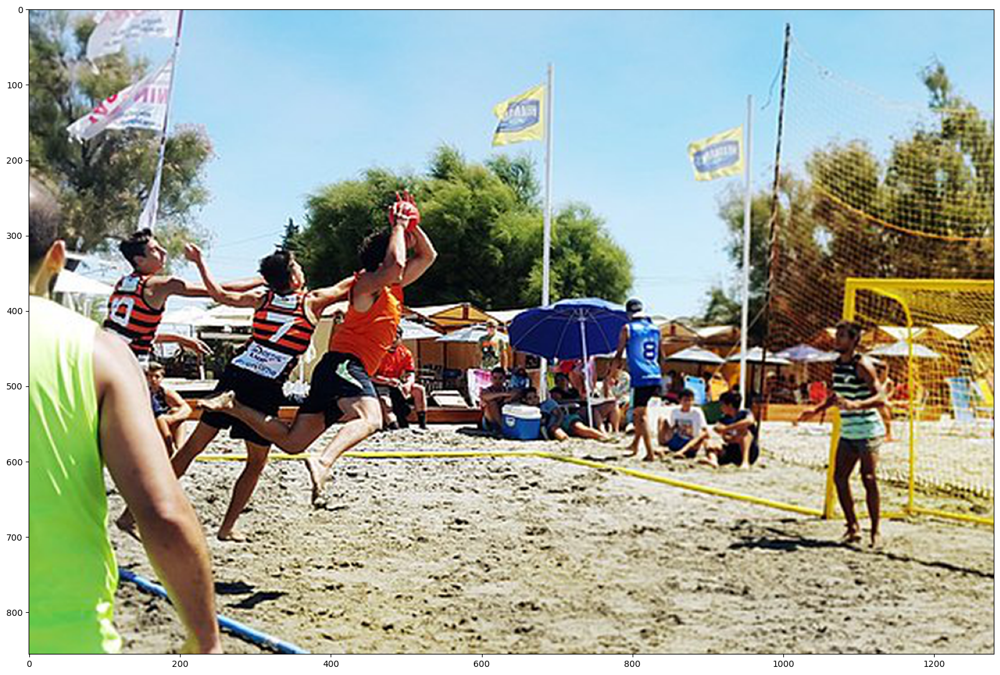

In [37]:
image_url = "https://upload.wikimedia.org/wikipedia/commons/thumb/d/db/Torneo_beach_handball.jpg/640px-Torneo_beach_handball.jpg"
downloaded_image_path = download_and_resize_image(image_url, 1280, 856, True)  # new_width와 new_height를 변경해 보세요.

In [38]:
module_handle = "https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1"  

detector = hub.load(module_handle).signatures['default'] # detector에 사용할 모듈 저장

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore
2023-11-08 17:55:46.320913: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'unused_control_flow_input_37' with dtype int32
	 [[{{node unused_control_flow_input_37}}]]
2023-11-08 17:55:46.340671: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'unused_control_flow_input_61' with dtype int32
	 [[{{node unused_control_flow_input_61}}]]
2023-11-08 17:55:46.357381: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVA

In [39]:
def load_img(path):
  img = tf.io.read_file(path)
  img = tf.image.decode_jpeg(img, channels=3)
  return img

In [40]:
def run_detector(detector, path):
  img = load_img(path) 

  converted_img  = tf.image.convert_image_dtype(img, tf.float32)[tf.newaxis, ...]

# 소요시간 측정
  start_time = time.time()
  result = detector(converted_img)
  end_time = time.time()

  result = {key:value.numpy() for key,value in result.items()}

# 이미지 추론 개수와 추론 시간 출력
  print("Found %d objects." % len(result["detection_scores"]))
  print("Inference time: ", end_time-start_time)

# 이미지 내 박스로 entity, scores를 추가하여 출력
  image_with_boxes = draw_boxes(
      img.numpy(), result["detection_boxes"],
      result["detection_class_entities"], result["detection_scores"])

  display_image(image_with_boxes)

2023-11-08 17:56:29.714352: W tensorflow/core/grappler/costs/op_level_cost_estimator.cc:690] Error in PredictCost() for the op: op: "CropAndResize" attr { key: "T" value { type: DT_FLOAT } } attr { key: "extrapolation_value" value { f: 0 } } attr { key: "method" value { s: "bilinear" } } inputs { dtype: DT_FLOAT shape { dim { size: -2484 } dim { size: -2485 } dim { size: -2486 } dim { size: 1088 } } } inputs { dtype: DT_FLOAT shape { dim { size: -105 } dim { size: 4 } } } inputs { dtype: DT_INT32 shape { dim { size: -105 } } } inputs { dtype: DT_INT32 shape { dim { size: 2 } } value { dtype: DT_INT32 tensor_shape { dim { size: 2 } } int_val: 17 } } device { type: "CPU" model: "0" num_cores: 12 environment { key: "cpu_instruction_set" value: "ARM NEON" } environment { key: "eigen" value: "3.4.90" } l1_cache_size: 16384 l2_cache_size: 524288 l3_cache_size: 524288 memory_size: 268435456 } outputs { dtype: DT_FLOAT shape { dim { size: -105 } dim { size: 17 } dim { size: 17 } dim { size: 10

Found 100 objects.
Inference time:  19.312586069107056
Font not found, using default font.


/var/folders/pr/61td1y8x20gbmv2fk3q0zlyc0000gn/T/ipykernel_84515/3949730329.py:19: DeprecationWarning: getsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use getbbox or getlength instead.
  display_str_heights = [font.getsize(ds)[1] for ds in display_str_list]
/var/folders/pr/61td1y8x20gbmv2fk3q0zlyc0000gn/T/ipykernel_84515/3949730329.py:29: DeprecationWarning: getsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use getbbox or getlength instead.
  text_width, text_height = font.getsize(display_str)


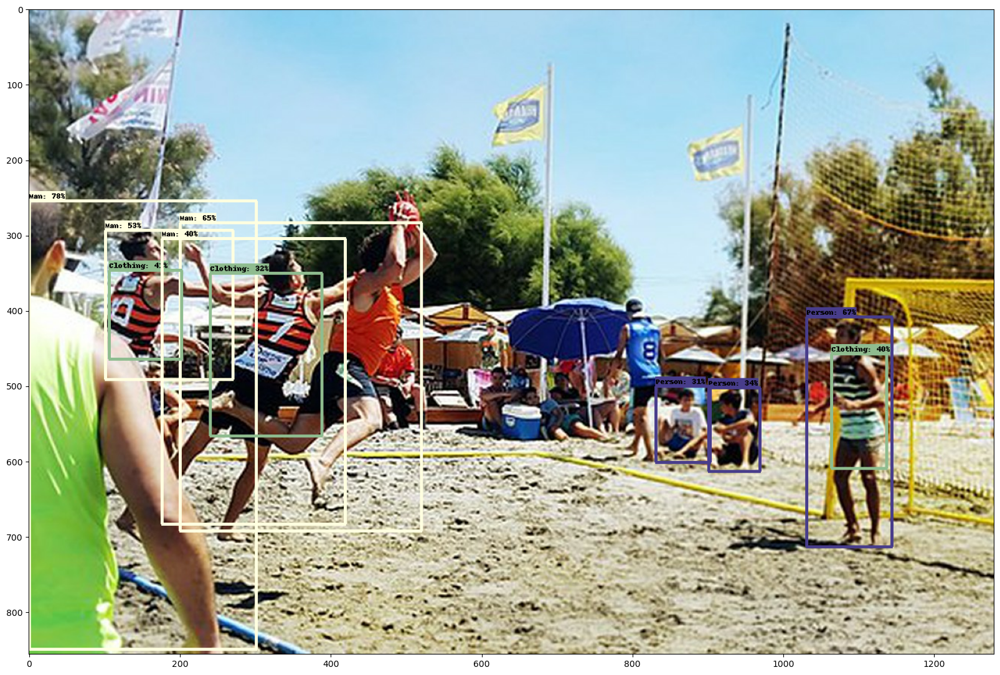

In [41]:
run_detector(detector, downloaded_image_path)

## 2-1. 다른 이미지 테스트해보기

/var/folders/pr/61td1y8x20gbmv2fk3q0zlyc0000gn/T/ipykernel_84515/3586607056.py:8: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.ANTIALIAS) # 이미지 조정


Image downloaded to /var/folders/pr/61td1y8x20gbmv2fk3q0zlyc0000gn/T/tmpzk2j_plb.jpg.


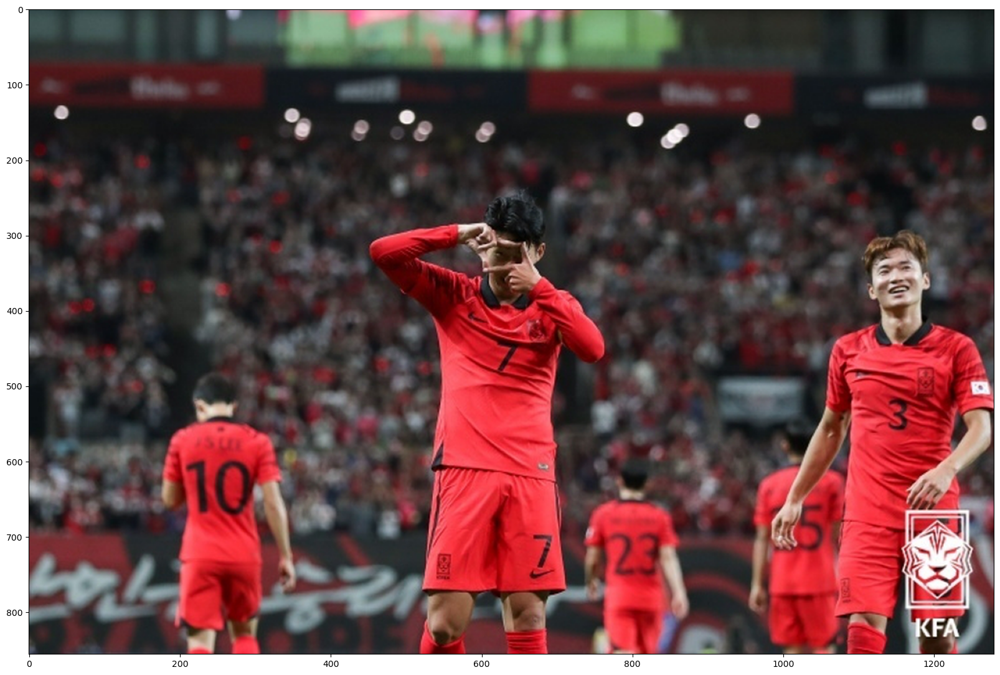

In [42]:
# 이미지 불러오기
image_url = "https://www.inthenews.co.kr/data/photos/20220939/art_16644389969025_53c4bc.jpg"
downloaded_image_path = download_and_resize_image(image_url, 1280, 856, True)  # new_width와 new_height를 변경해 보세요.

Found 100 objects.
Inference time:  3.545478105545044
Font not found, using default font.


/var/folders/pr/61td1y8x20gbmv2fk3q0zlyc0000gn/T/ipykernel_84515/3949730329.py:19: DeprecationWarning: getsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use getbbox or getlength instead.
  display_str_heights = [font.getsize(ds)[1] for ds in display_str_list]
/var/folders/pr/61td1y8x20gbmv2fk3q0zlyc0000gn/T/ipykernel_84515/3949730329.py:29: DeprecationWarning: getsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use getbbox or getlength instead.
  text_width, text_height = font.getsize(display_str)


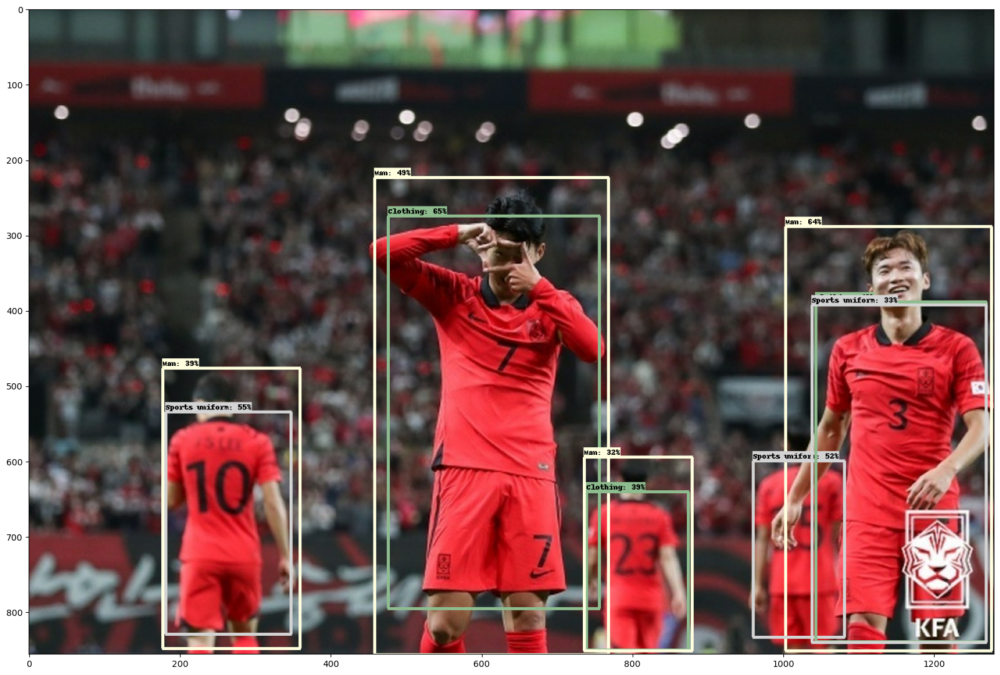

In [43]:
# 테스트
run_detector(detector, downloaded_image_path)

## 문제 2-2. 다양한 pre-trained model 테스트해보기

In [44]:
# 문제 2-2. 모델 불러오기
module_handle = "https://tfhub.dev/google/openimages_v4/ssd/mobilenet_v2/1"

detector = hub.load(module_handle).signatures['default']# detector에 사용할 모듈 저장

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore
2023-11-08 17:57:48.579437: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'unused_control_flow_input_9' with dtype int32
	 [[{{node unused_control_flow_input_9}}]]
2023-11-08 17:57:48.598074: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'unused_control_flow_input_12' with dtype int32
	 [[{{node unused_control_flow_input_12}}]]
2023-11-08 17:57:48.601746: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALI

/var/folders/pr/61td1y8x20gbmv2fk3q0zlyc0000gn/T/ipykernel_84515/3586607056.py:8: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.ANTIALIAS) # 이미지 조정


Image downloaded to /var/folders/pr/61td1y8x20gbmv2fk3q0zlyc0000gn/T/tmppuzyfviy.jpg.


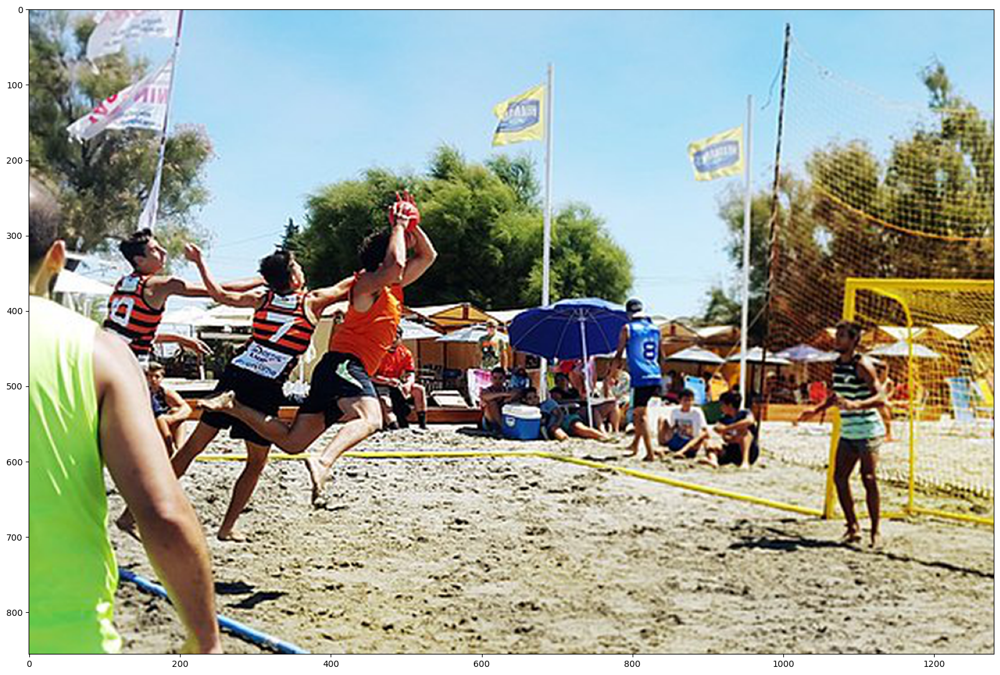

In [45]:
# 문제 2-2. 테스트 
image_url = "https://upload.wikimedia.org/wikipedia/commons/thumb/d/db/Torneo_beach_handball.jpg/640px-Torneo_beach_handball.jpg"
downloaded_image_path = download_and_resize_image(image_url, 1280, 856, True)  # new_width와 new_height를 변경해 보세요.

Found 100 objects.
Inference time:  3.9249887466430664
Font not found, using default font.
1번째 모델인 Inception ResNet을 사용한 Faster RCNN은 조금 느리지만 높은 정확성을 보였습니다.
2번째 모델인 ImageNet pre-trained MobileNet V2을 사용한 SSD는 느리고 낮은 정확성을 보였습니다.


/var/folders/pr/61td1y8x20gbmv2fk3q0zlyc0000gn/T/ipykernel_84515/3949730329.py:19: DeprecationWarning: getsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use getbbox or getlength instead.
  display_str_heights = [font.getsize(ds)[1] for ds in display_str_list]
/var/folders/pr/61td1y8x20gbmv2fk3q0zlyc0000gn/T/ipykernel_84515/3949730329.py:29: DeprecationWarning: getsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use getbbox or getlength instead.
  text_width, text_height = font.getsize(display_str)


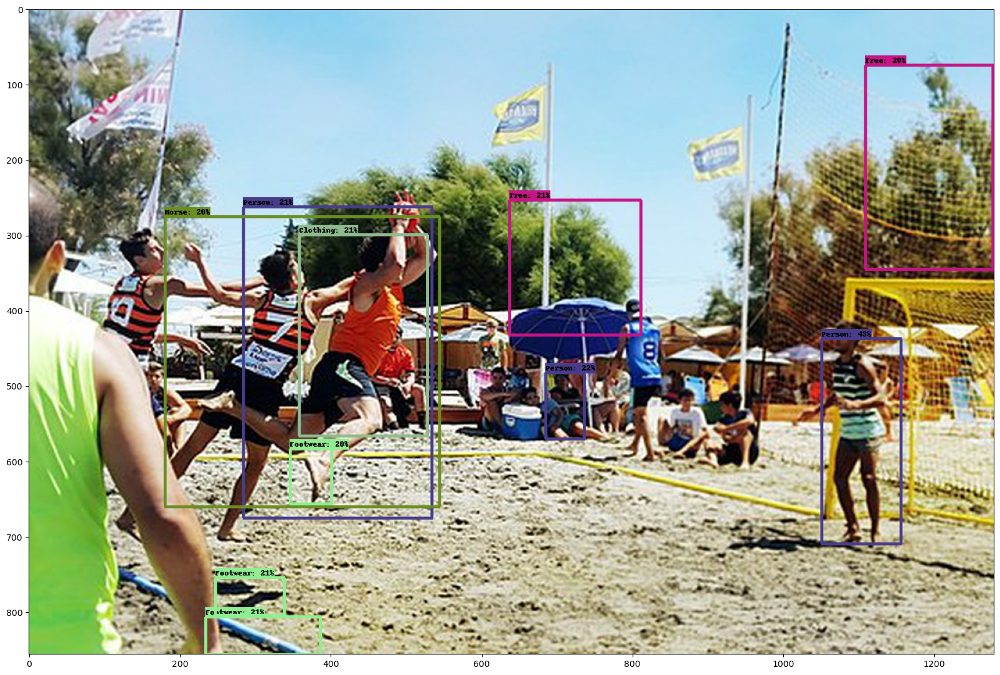

In [46]:
run_detector(detector, downloaded_image_path)
# 문제 2-2. 결과 비교
print("1번째 모델인 Inception ResNet을 사용한 Faster RCNN은 조금 느리지만 높은 정확성을 보였습니다.")
print("2번째 모델인 ImageNet pre-trained MobileNet V2을 사용한 SSD는 느리고 낮은 정확성을 보였습니다.")

# 소감
---
```
1. VGG16 모델을 구현할 수 있는가?	이미지로 제시된 VGG16 모델을 코드로 구현하였다.
2. 다양한 방법을 사용하여 성능을 향상시켰는가?	다양한 방법을 사용하여 accuracy 53% 이상을 달성하였다.
3. 다양한 이미지와 모델을 사용하여 Object Detection을 수행하였는가?	제시된 이미지 외의 다른 이미지에 Object Detection을 수행하였고, 1가지 이상의 사전 학습된 모델을 사용하여 결과를 비교하였다.

```


